In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import glob

Eplications: 

- le canny edge detector detecte les edge avec une certaine sensibilité 
- un closing permet de connecter les gaps et connecter quelqyes edges
- le lines hough : detecte les ignes droites et les supprime , ce qui permet de nettoyer encore plus ( les coins ne doivent pas voire de lignes droites)
- un mask est aplliqué au bas de l'image pour masquer une partie de la main et la montre qui a 5000000 edge 
- Finalement le Hough =circle detector detecte les cercles :) 

In [145]:

    
def detect_and_display_circles(image_path):
    # Load the image
    img = cv2.imread(image_path, cv2.IMREAD_COLOR)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian Blur to the image
    blurred = cv2.GaussianBlur(gray, (9, 9), 2)

    edges = cv2.Canny(blurred, 15, 60 , apertureSize=3)
    kernel = np.ones((3, 3), np.uint8)
    edges = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)
   
   # plt.imshow(edges)
   
    lines = cv2.HoughLinesP(edges, 1, np.pi / 180, threshold=90, minLineLength=1, maxLineGap=80)
    mask = np.ones_like(edges) * 255
    if lines is not None:
        for line in lines:
            for x1, y1, x2, y2 in line:
                cv2.line(mask, (x1, y1), (x2, y2), 0, 5)

    edges = cv2.bitwise_and(edges, mask)
    mask_watch = np.ones_like(edges) * 255
    #for the watch !!!! 
    cv2.rectangle(mask_watch, (0, 850), (1500, 1000), 0, -1)
    edges = cv2.bitwise_and(edges, mask_watch)
    #plt.imshow(edges)
    plt.imshow(edges)

   
    # Apply Hough Circle Transform on the masked image
    circles = cv2.HoughCircles(edges, cv2.HOUGH_GRADIENT, dp=1, minDist=100,
                                    param1=150, param2=22 , minRadius=50, maxRadius=100)
    
    
   
    # Convert the (x, y) coordinates and radius of the circles to integers
    plt.figure(figsize=(8, 8))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    if circles is not None:
        circles = np.uint16(np.around(circles))[0, :]
        for (x, y, r) in circles:
            plt.gca().add_patch(plt.Circle((x, y), r, color='red', fill=False, linewidth=2))
    plt.title('Detected Circles in ' + os.path.basename(image_path))
    plt.axis('off')
    plt.show()

def process_images_in_directory(directory_path):
    # List all jpg images in the directory
    images = glob.glob(os.path.join(directory_path, '*.JPG'))
    for image_path in images:
        detect_and_display_circles(image_path)
        #adaptive_thresholding(image_path)


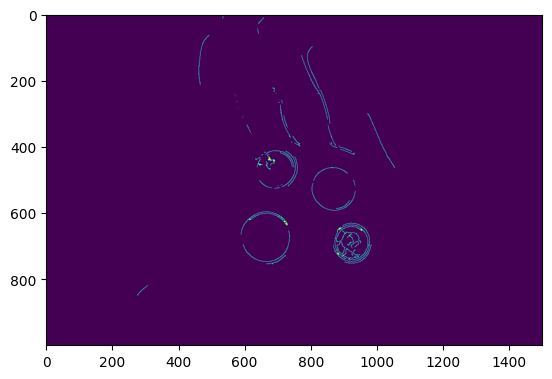

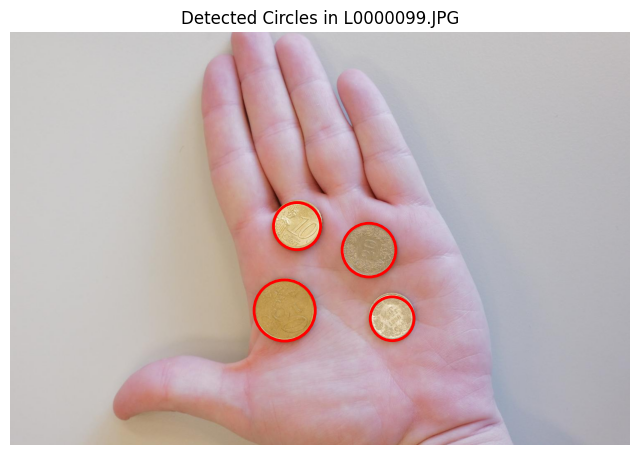

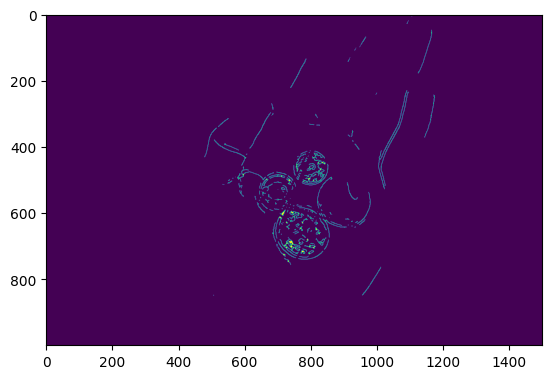

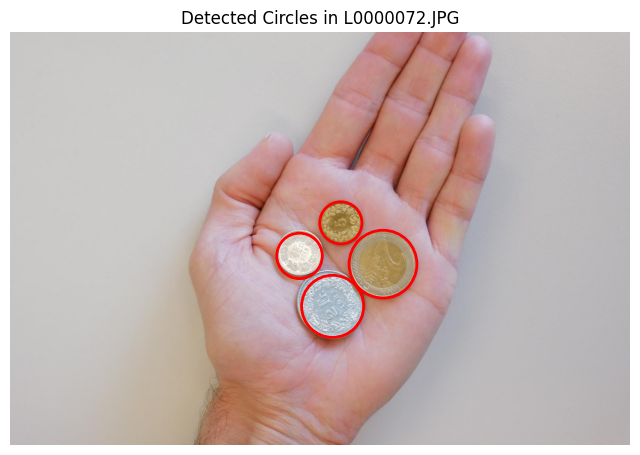

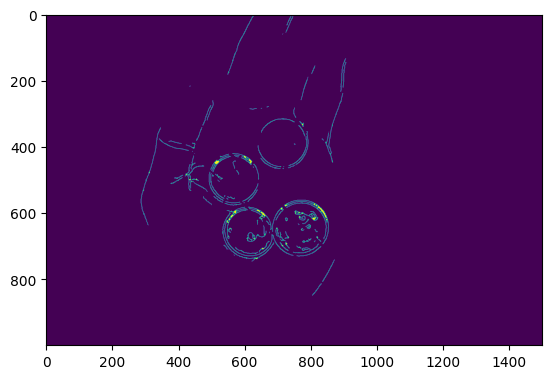

...

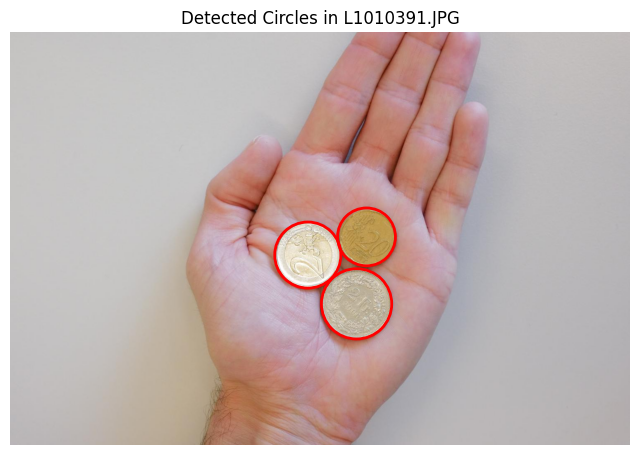

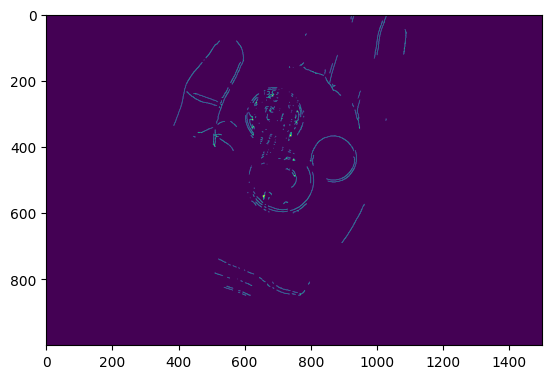

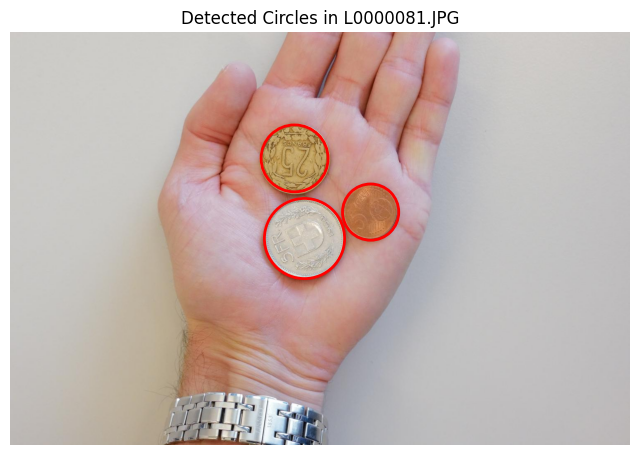

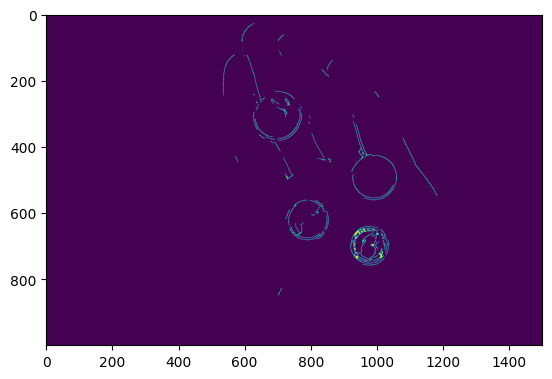

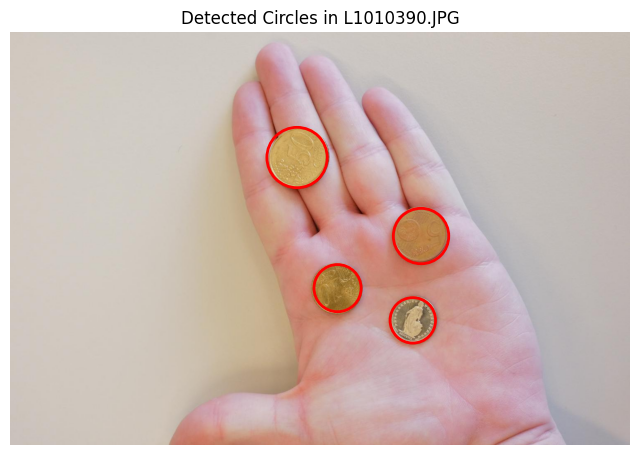

In [146]:
directory_path = 'downsampled/train/hand/'
process_images_in_directory(directory_path)